# Hurricane and Storm Road Risk Visualization

## Introduction

For the project, we chose to model hurricanes in the 10 year period of 2005-2014. We're looking at how hurricanes intersect with counties and roads. This is quite useful because it can be shown which counties/roads will be most affected in the coming future and subsequently aid it reinforcement efforts.

In [1]:
import numpy as np
import geopandas as gpd
from geopandas import GeoSeries
from geopandas import GeoDataFrame

import cartopy.crs as ccrs
import matplotlib.pyplot as plt

import pandas as pd
from shapely.geometry import Point
from shapely.geometry import LineString

In [11]:
#This cell loads, our shapefiles
roads = gpd.read_file('tl_2015_us_primaryroads.shp')
county = gpd.read_file('tl_2019_us_county.shp')
counties = county[county['STATEFP'].isin(['02','15','78','69','66','60']) == False]
#county

In [12]:
#This cell loads Hurricane data and furthermore, manipulates it into a geo-data-frame
#with relevant conversions
MEP = pd.read_csv('MisEnPlaceFloat.csv')
MEP['long'] = 0 - MEP['long']
MEP['coordinates'] = MEP[['long', 'lat']].values.tolist()
MEP['coordinates'] = MEP['coordinates'].apply(Point)
MEP = gpd.GeoDataFrame(MEP, geometry='coordinates')
geometry = [Point(xy) for xy in zip(MEP.long, MEP.lat)]
MEP = GeoDataFrame(MEP, geometry=geometry) 
MEP = MEP.groupby(['year','name'])['geometry'].apply(lambda x: LineString(x.tolist()))
MEP = GeoDataFrame(MEP, geometry='geometry')
#MEP

## Data Modelling

In [54]:
class Hurricane:
    """
    This class maps Hurricanes by 2 parameters
    1. User specified year
    2. Hurricane data -> MEP
    """
    def __init__(self, year, hurframe):
        self.year = year
        self.hurframe = hurframe #Input Hurricane Data File
        
    def visualization(self):
        fig, axsub = plt.subplots(1,1, figsize = (15,10))
        axsub.set(xlim=(-110, -40), ylim=(10, 55))
        axsub.set_title("Hurricane paths for " + str(self.year),fontdict={'fontsize' : '40', 'fontweight' : '3'})
        counties = county[county['STATEFP'].isin(['02','15','78','69','66','60']) == False]
        counties.plot(color='#C0C0C0',edgecolor = 'black',ax = axsub)
        roads.plot(ax = axsub, color = 'yellow',alpha = 0.5)
        self.hurframe.loc[self.year].plot(ax = axsub, color = 'blue')
        #plt.show()

In [70]:
class Roads:
    """
    The Roads Class shows where Hurricanes intersect the road
    specified by year
    """
    def __init__(self, load_road, load_county, year):
        self.load_road = load_road
        
        self.load_county = load_county
        self.year = year 
        
    def intersect(self, load_road):
        for row in load_road['geometry']:
            for i in MEP.loc[self.year]['geometry']:
                if((i.intersects(row))):
                    road_geom.append(row)
        road_obj['geometry'] = road_geom
    def visualization(self, load_county):
        counties = county[county['STATEFP'].isin(['02','15','78','69','66','60']) == False]
        fig, axsub = plt.subplots(1,1, figsize = (15,10))
        axsub.set(xlim=(-110, -65), ylim=(15, 52))
        axsub.set_title("Hurricane-Road Intersections in " + str(self.year),fontdict={'fontsize' : '40', 'fontweight' : '3'})
        counties.plot(color='#BA6958',edgecolor = 'white',ax = axsub)
        road_obj.plot(ax=axsub)

In [67]:
class County:
    """
    This County class shows intersections of hurricanes and counties
    This class also takes in a time. 
    """
    def __init__(self, load_county, county_df, hurricane_df, year):
        self.load_county = load_county
        self.year = year

    def intersect(self, load_county, county_df, hurricane_df):
        county_geometry = []
        hurricane_geometry = []
        for row in load_county['geometry']:
            for i in MEP.loc[self.year]['geometry']:
                if((i.intersects(row))):
                    county_geometry.append(row)
                    hurricane_geometry.append(i)
        hurricane_df['geometry'] = hurricane_geometry
        county_df['geometry'] = county_geometry
    def visualization(self, load_county, county_df):
        fig, axsub = plt.subplots(1,1, figsize = (15,10))
        conus = load_county[load_county['STATEFP'].isin(['02','15','78','69','66','60']) == False]
        axsub.set(xlim=(-110, -40), ylim=(10, 55))        
        axsub.set_title("Hurricane-County Intersections " + str(self.year),fontdict={'fontsize' : '40', 'fontweight' : '3'})
        conus.plot(color='#C0C0C0',edgecolor = 'black',ax = axsub, alpha = 0.5)
        MEP.loc[self.year].plot(ax = axsub, color='blue')
        county_df.plot(ax = axsub, color = 'crimson')

## Data Analysis

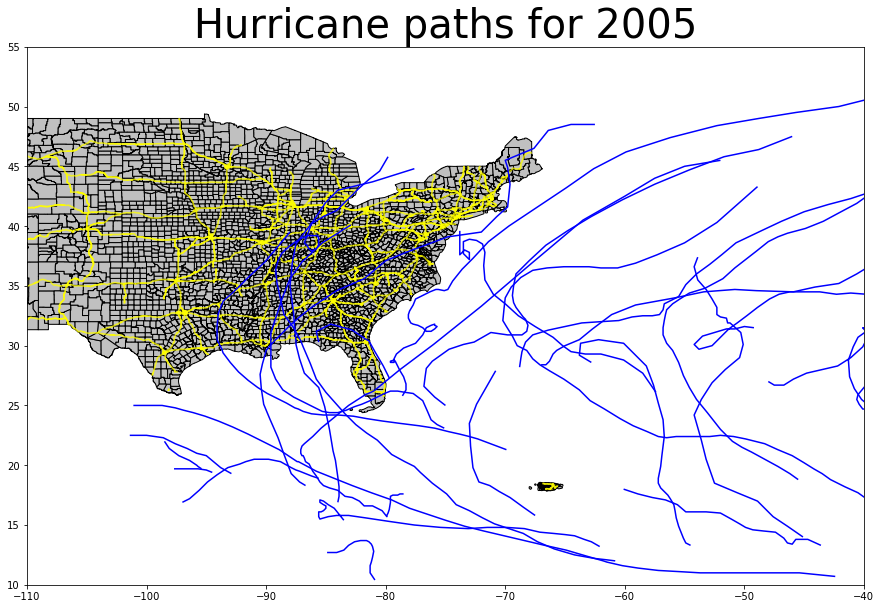

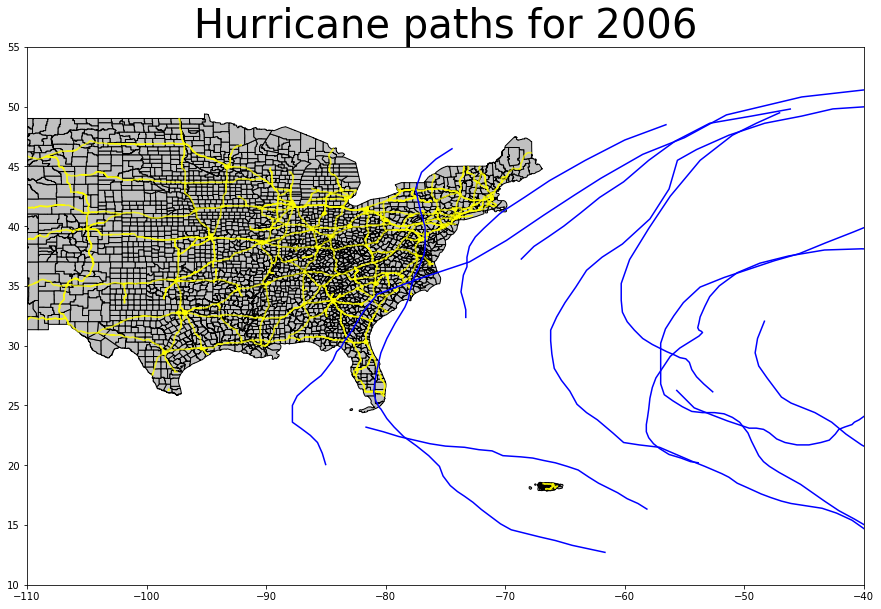

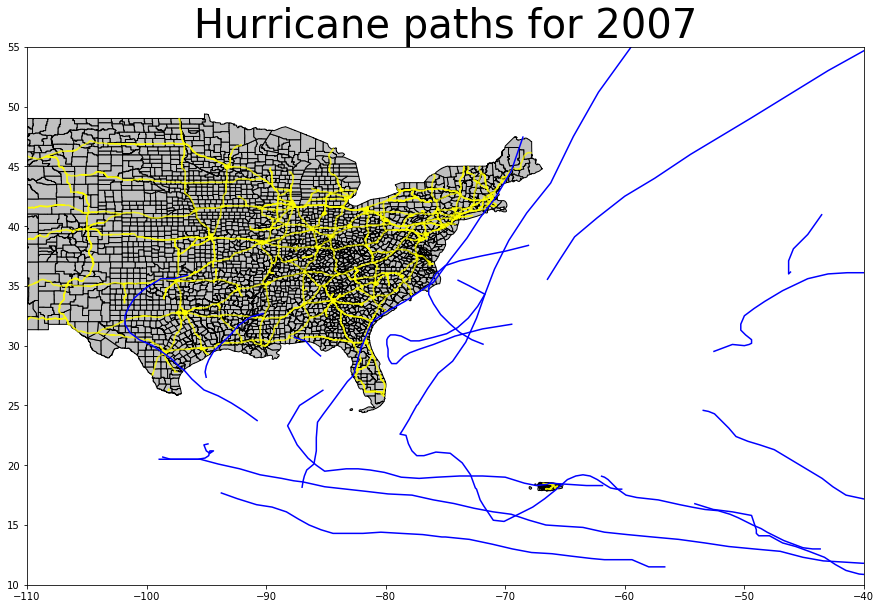

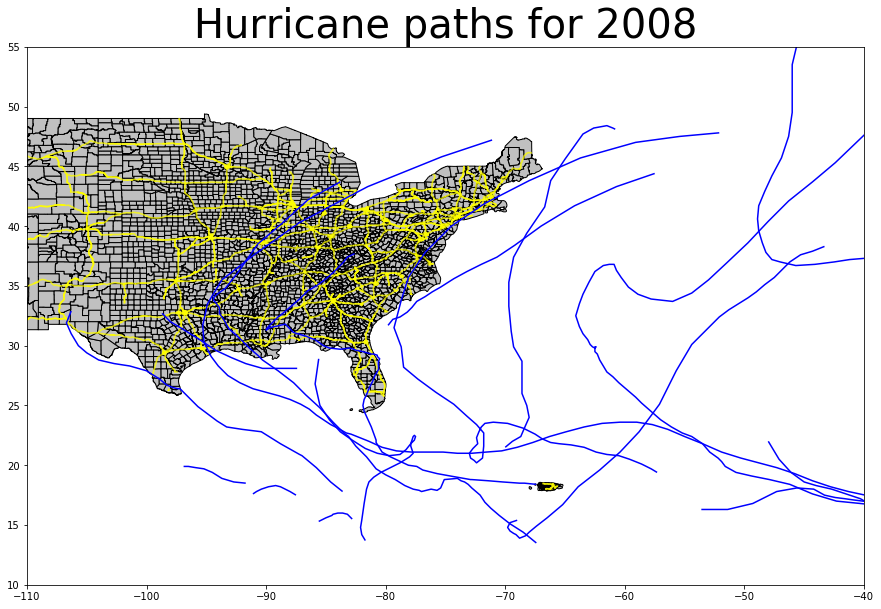

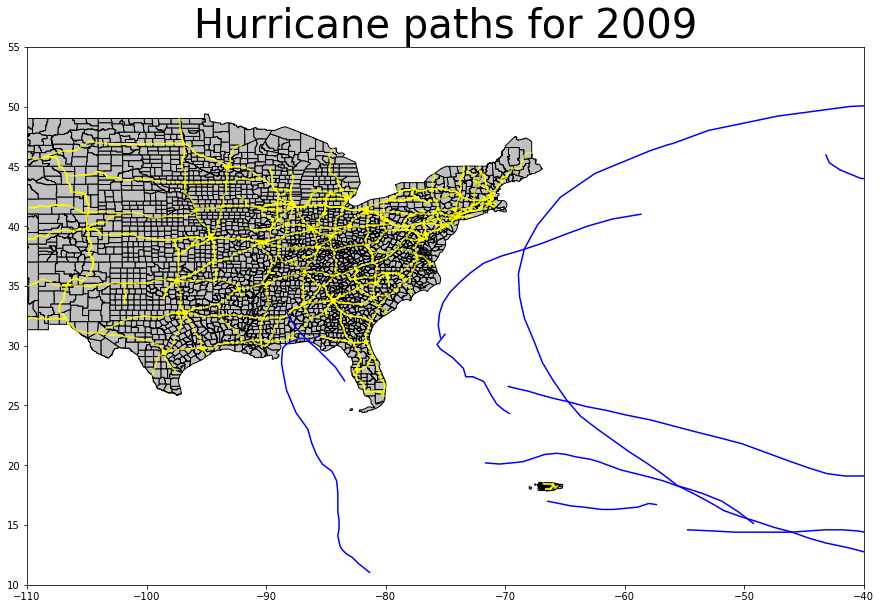

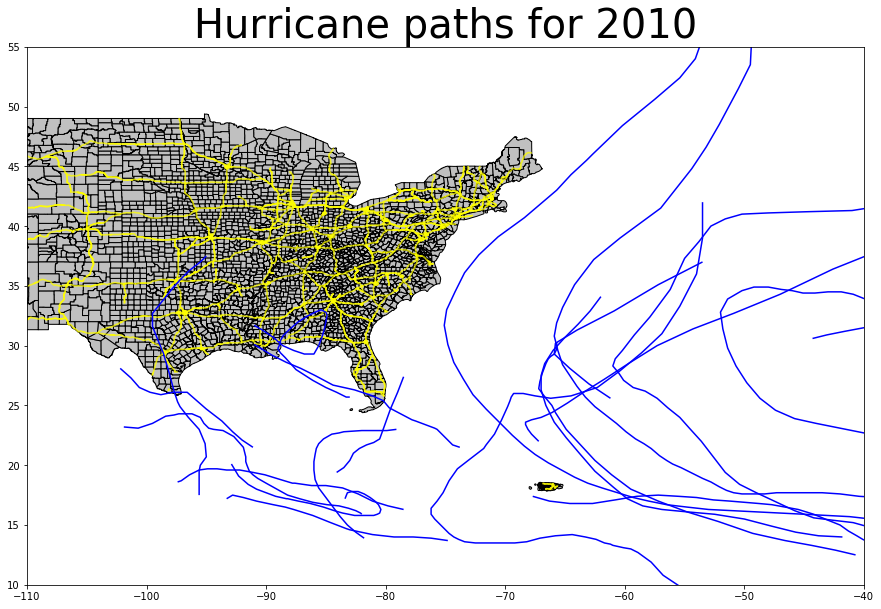

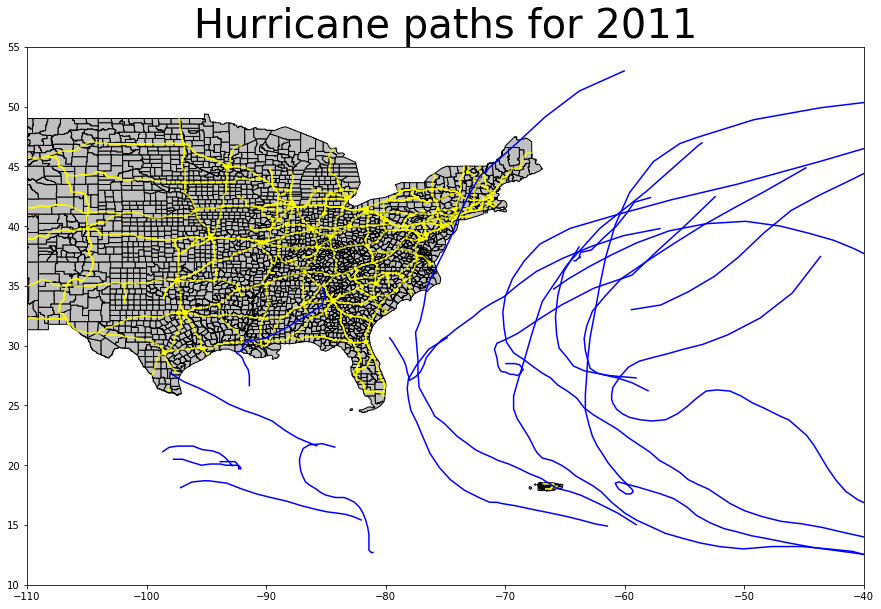

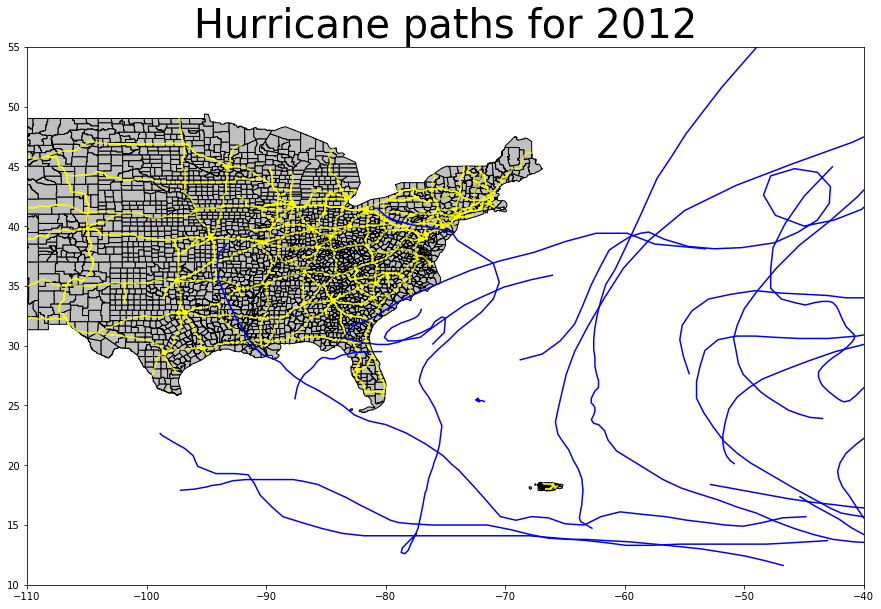

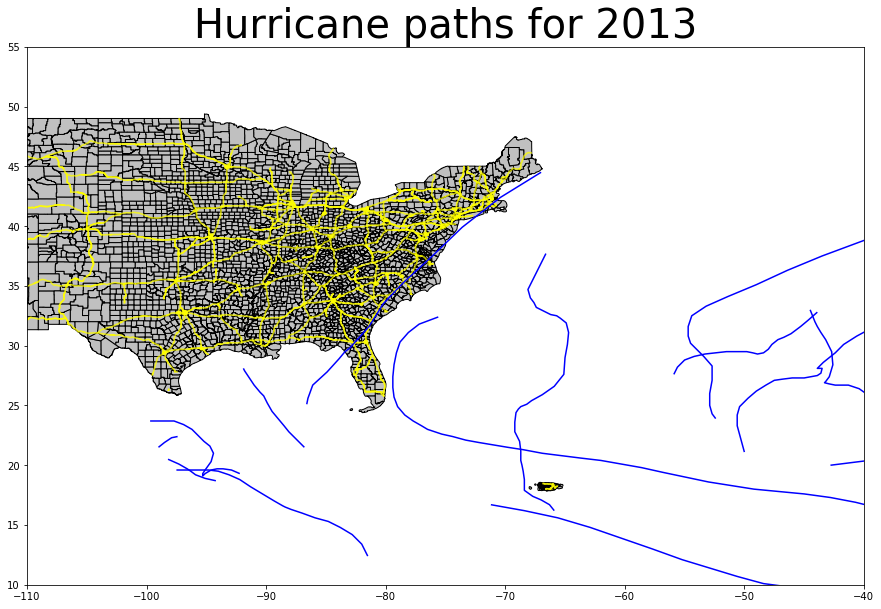

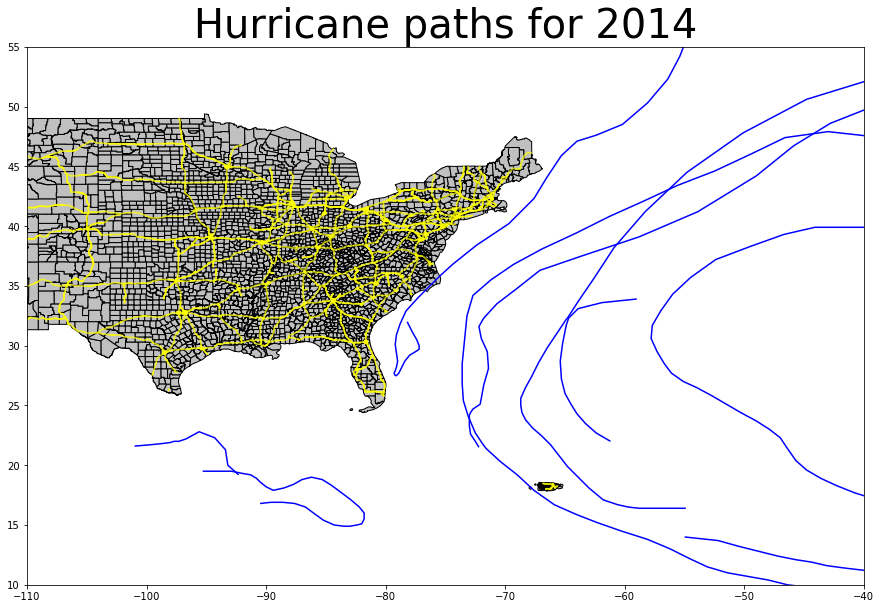

In [55]:
#Can Change Year i.e. instead of 2005, use 2014
#HUR = Hurricane(2005, MEP)
#HUR.visualization()

ityr = [2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014]
lyr = len(ityr)
curyr = 0

while curyr < lyr:
    HUR = Hurricane(ityr[curyr], MEP)
    HUR.visualization()
    curyr += 1


C:\Users\lostk\Anaconda3\envs\geo_env\lib\site-packages\geopandas\plotting.py:510: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


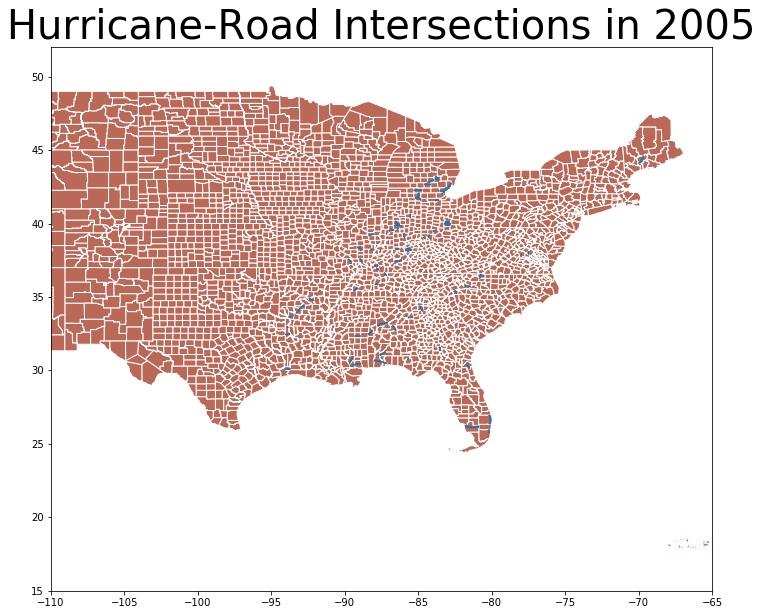

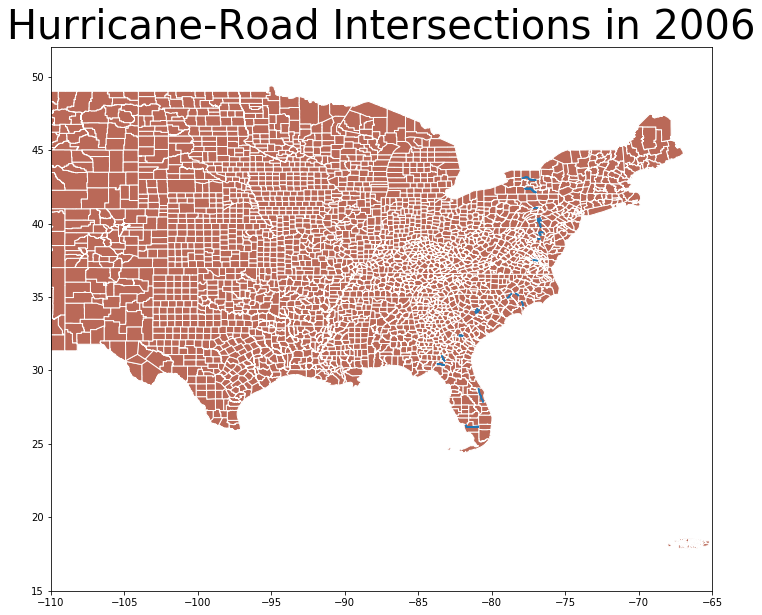

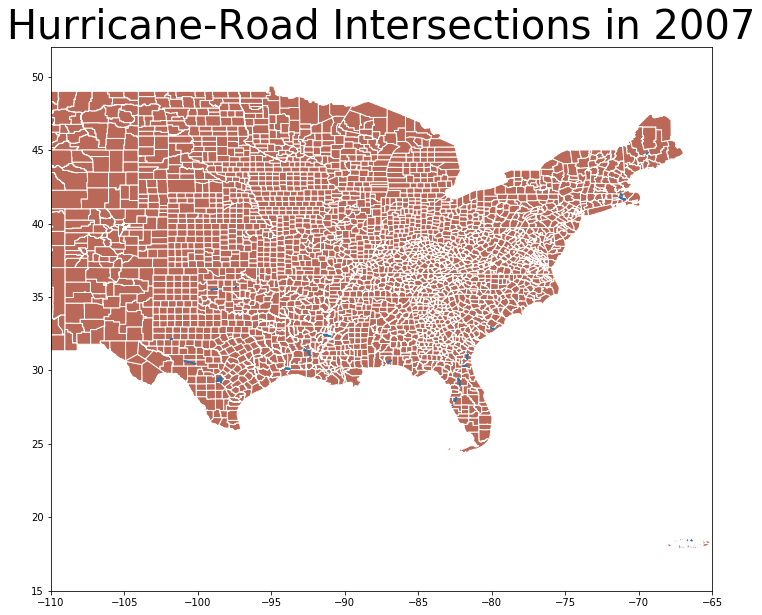

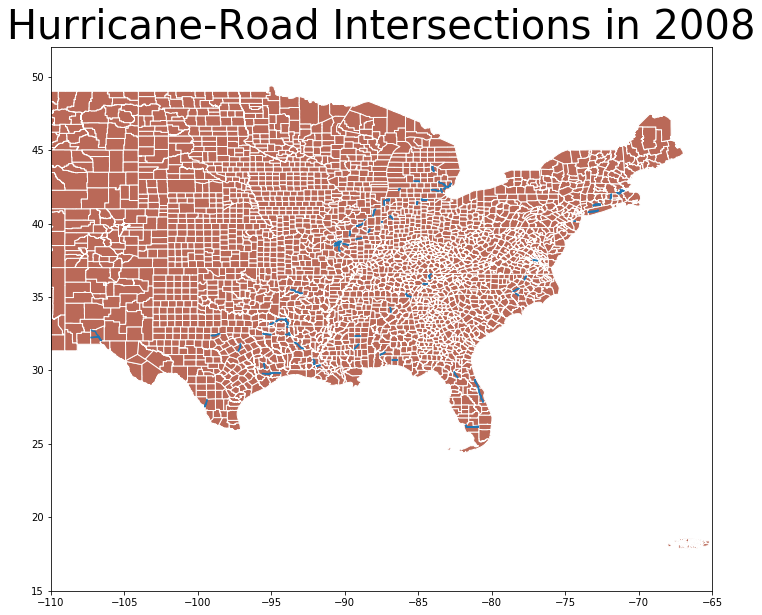

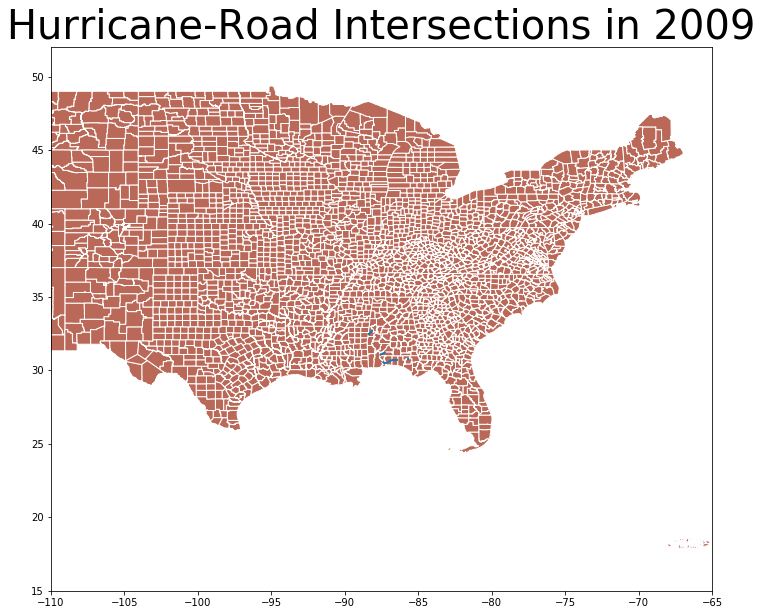

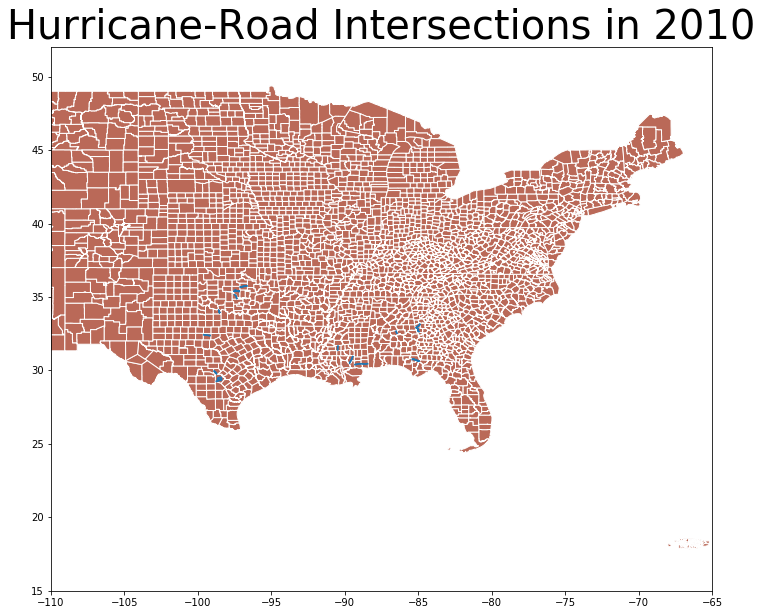

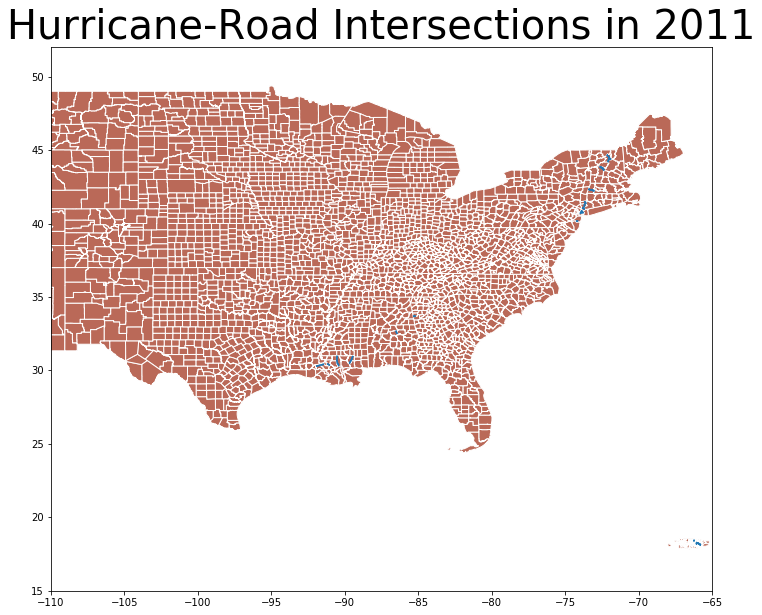

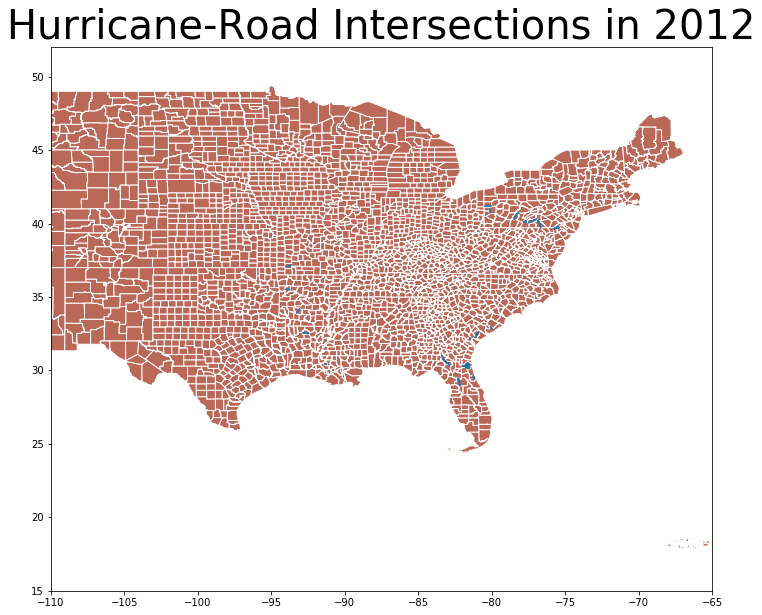

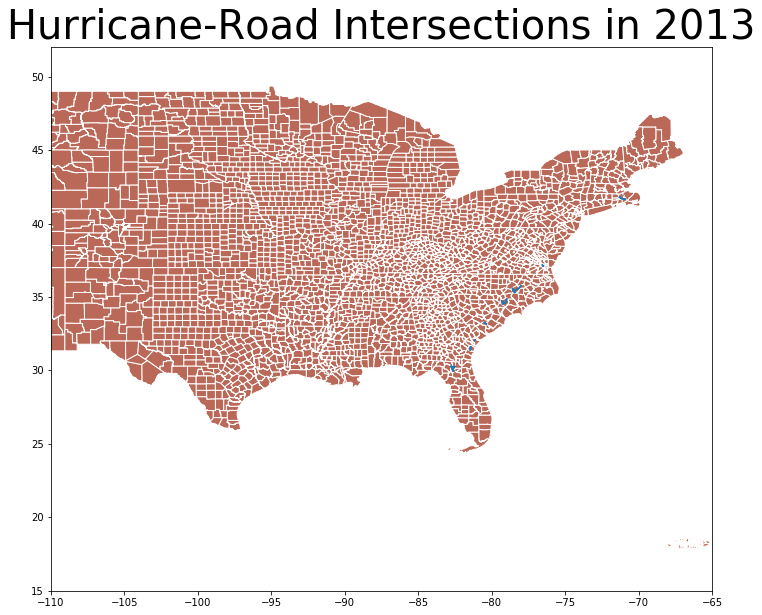

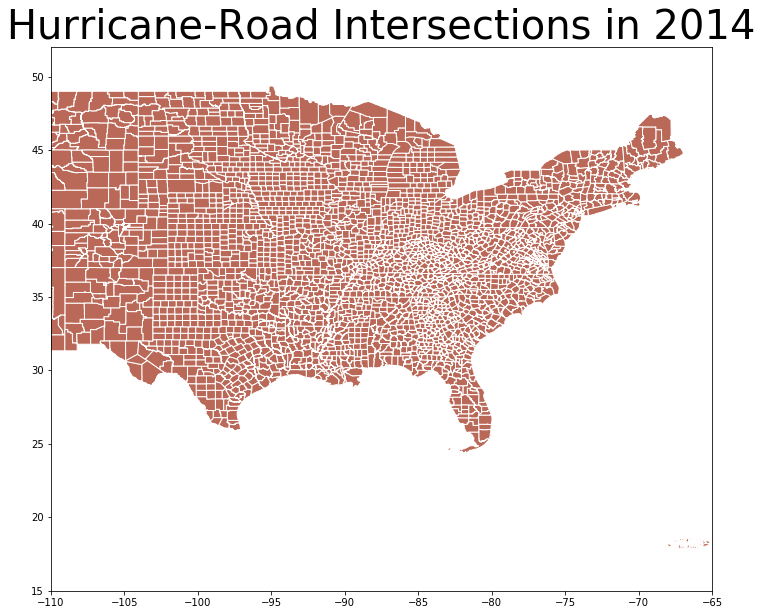

In [71]:
ityr = [2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014]
lyr = len(ityr)
curyr = 0

while curyr < lyr:
    road_geom = []
    road_obj = GeoDataFrame()
    
    r = Roads(roads, counties, ityr[curyr])
    r.intersect(roads)
    r.visualization(roads)
    #print(ityr[curyr])
    curyr += 1

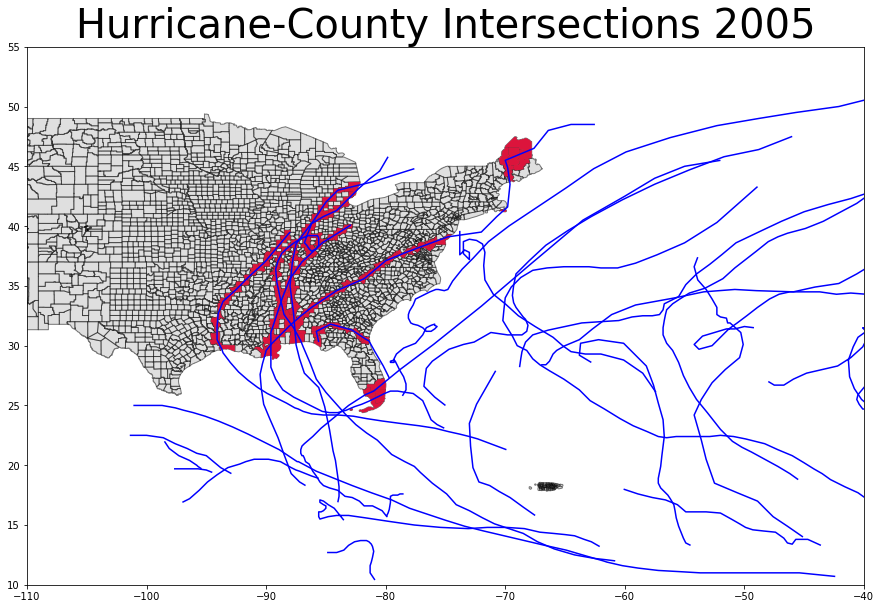

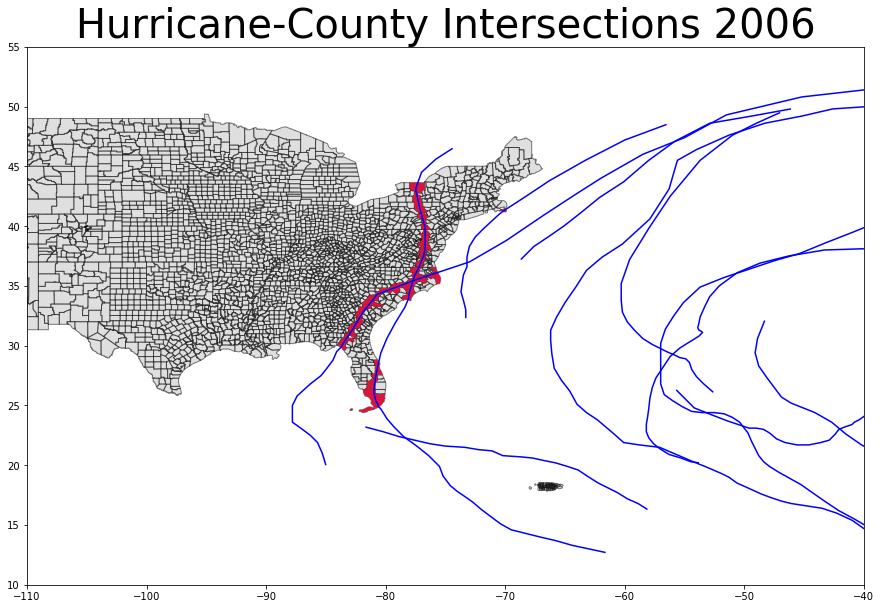

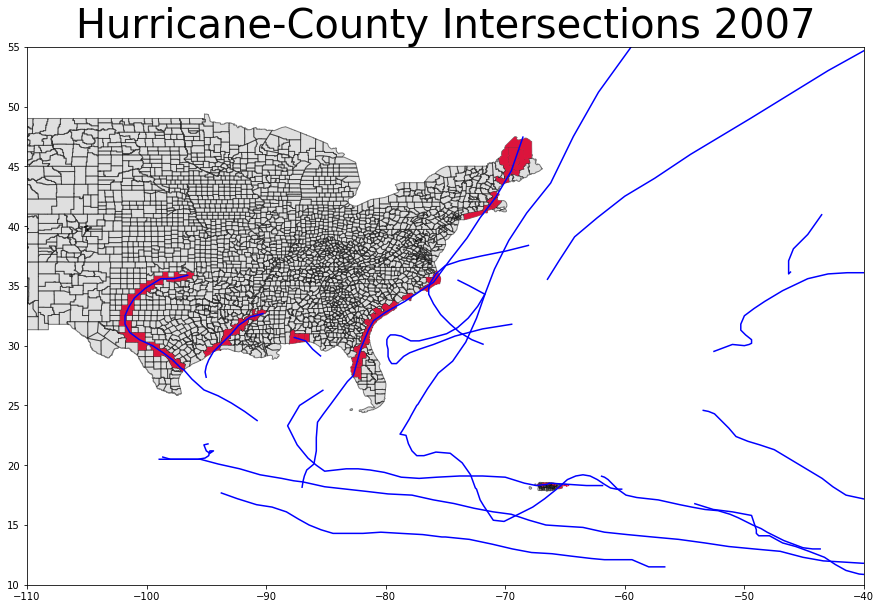

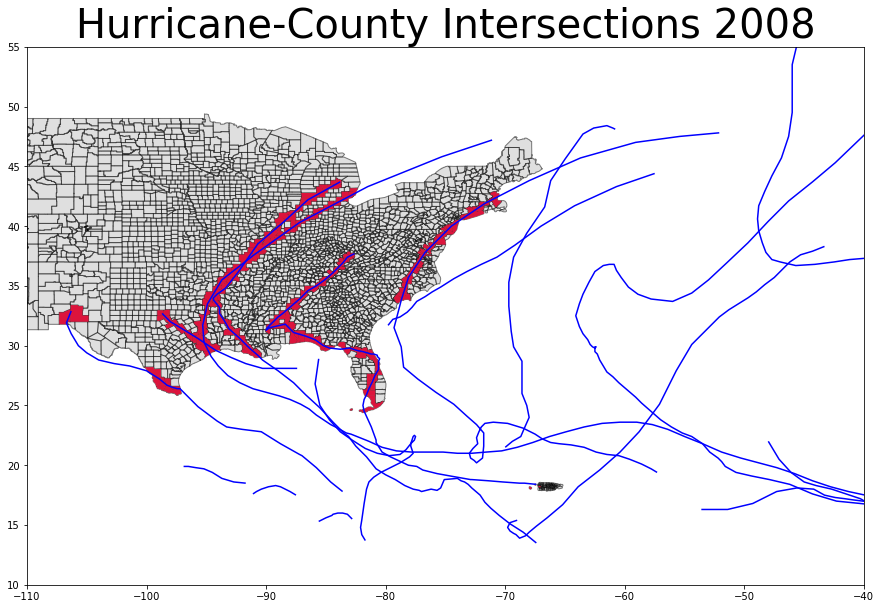

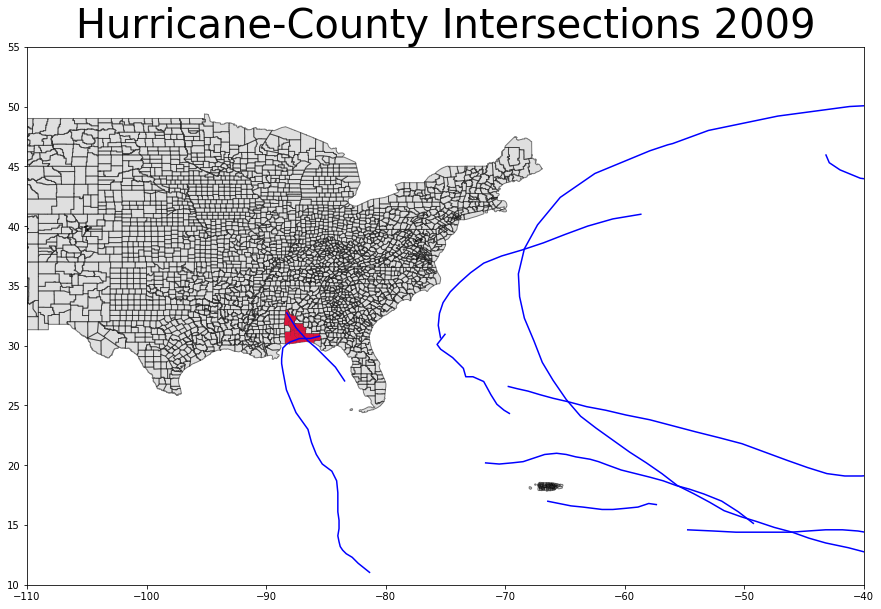

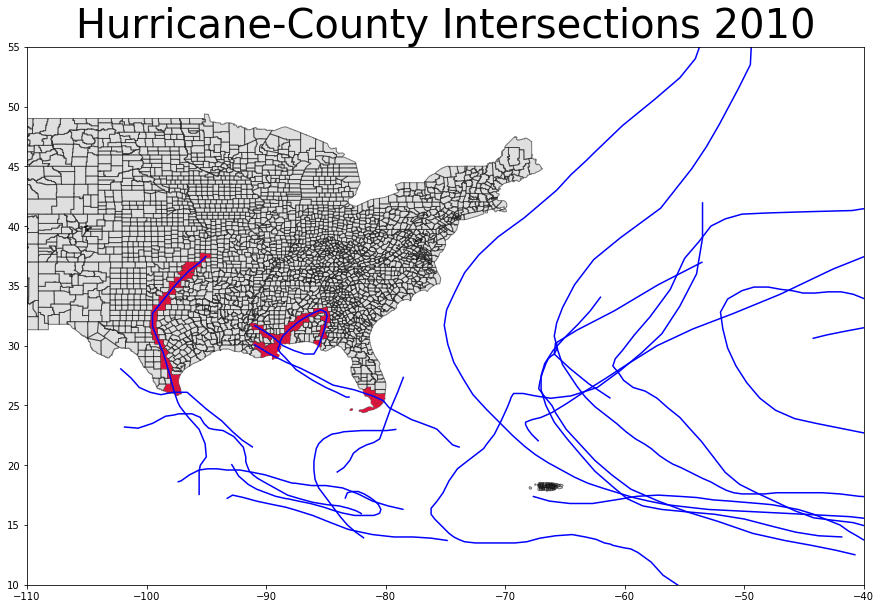

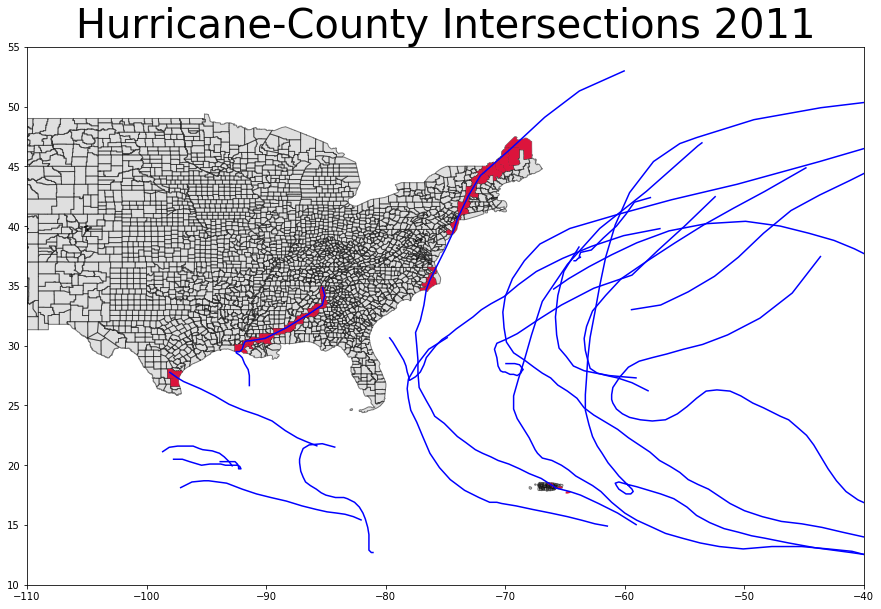

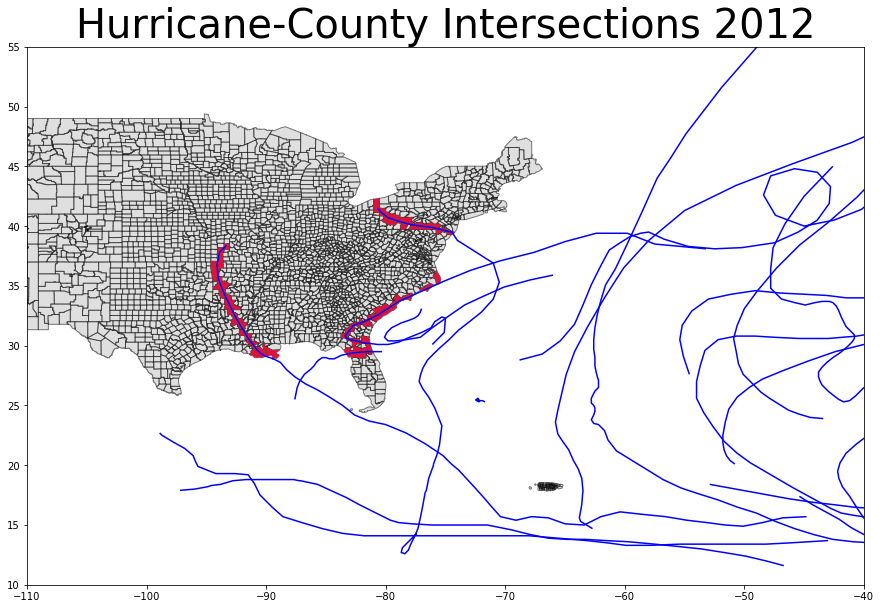

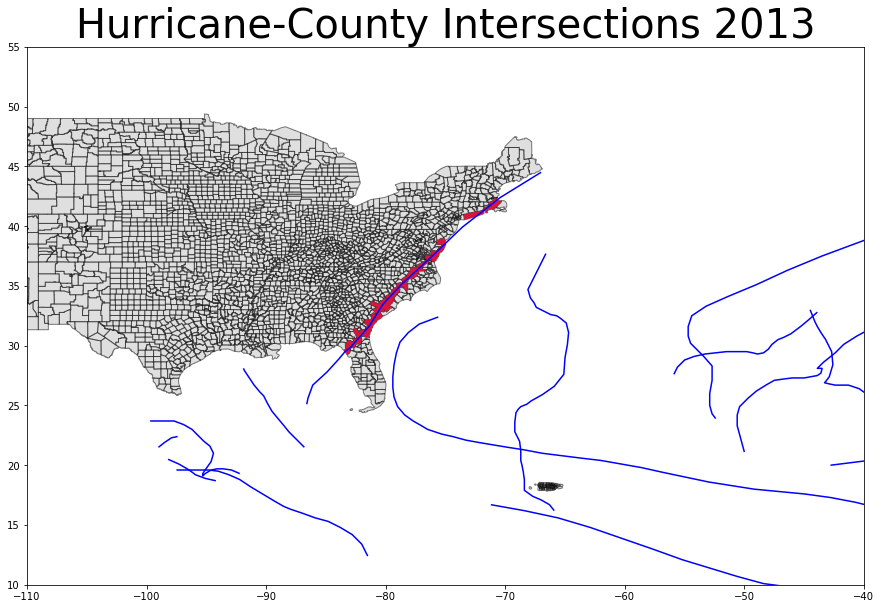

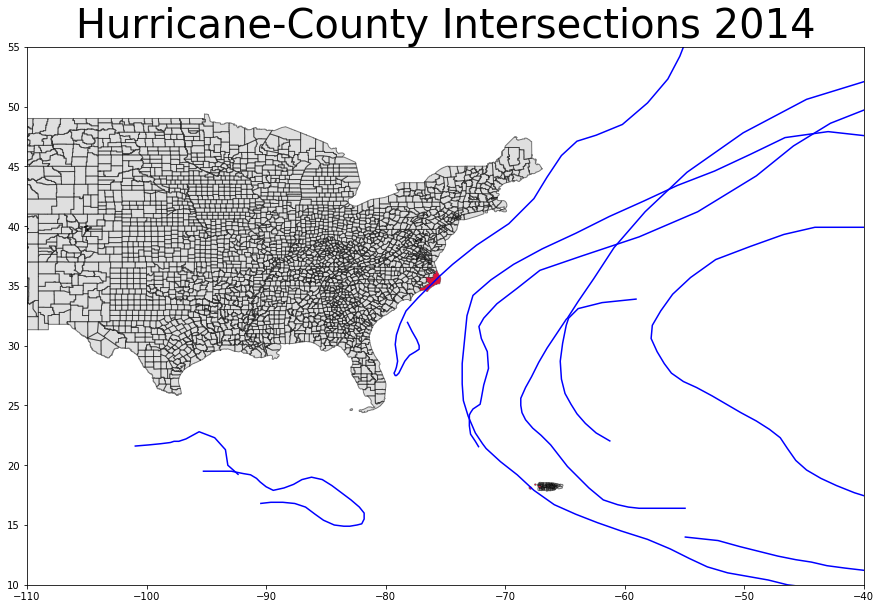

In [68]:
ityr = [2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014]
lyr = len(ityr)
curyr = 0

while curyr < lyr:
    counties_gdf = gpd.GeoDataFrame()
    hur_gdf = gpd.GeoDataFrame()

    h = County(county, counties_gdf, hur_gdf, ityr[curyr])
    h.intersect(county, counties_gdf, hur_gdf)
    h.visualization(county, counties_gdf)
    curyr += 1

## Visualization & Report

In [35]:
class CountyChoropleth:
    """
    A county class designed to create a choropleth better suited for all 10 years
    """
    def __init__(self, load_county, load_hurricane, county_df, hurricane_df):
        self.load_county = load_county
        self.load_hurricane = load_hurricane

    def intersect(self, load_county, load_hurricane, county_df, hurricane_df):
        county_geometry = []
        hurricane_geometry = []
        for row in load_county['geometry']:
            for i in load_hurricane['geometry']:
                if((i.intersects(row))):
                    county_geometry.append(row)
                    hurricane_geometry.append(i)
        hurricane_df['geometry'] = hurricane_geometry
        county_df['geometry'] = county_geometry

In [36]:
counties_gdf = gpd.GeoDataFrame()
hur_gdf = gpd.GeoDataFrame()

h = CountyChoropleth(county, MEP, counties_gdf, hur_gdf)
h.intersect(county, MEP, counties_gdf, hur_gdf)
mergedcounties = gpd.sjoin(counties_gdf, county, how = 'inner', op = 'within')
#mergedcounties

C:\Users\lostk\Anaconda3\envs\geo_env\lib\site-packages\geopandas\tools\sjoin.py:61: UserWarning: CRS of frames being joined does not match!(None != {'init': 'epsg:4269'})
  "(%s != %s)" % (left_df.crs, right_df.crs)


In [37]:
new_county = gpd.GeoDataFrame({'NAME': mergedcounties['NAME'], "geometry":mergedcounties['geometry'], "Count":""})
county_table = new_county.pivot_table(index=['NAME'], aggfunc={'Count':'size'})

county_merge = pd.merge(county_table, new_county, on=['NAME'], how="inner")
county_counts = gpd.GeoDataFrame(county_merge)
#county_counts

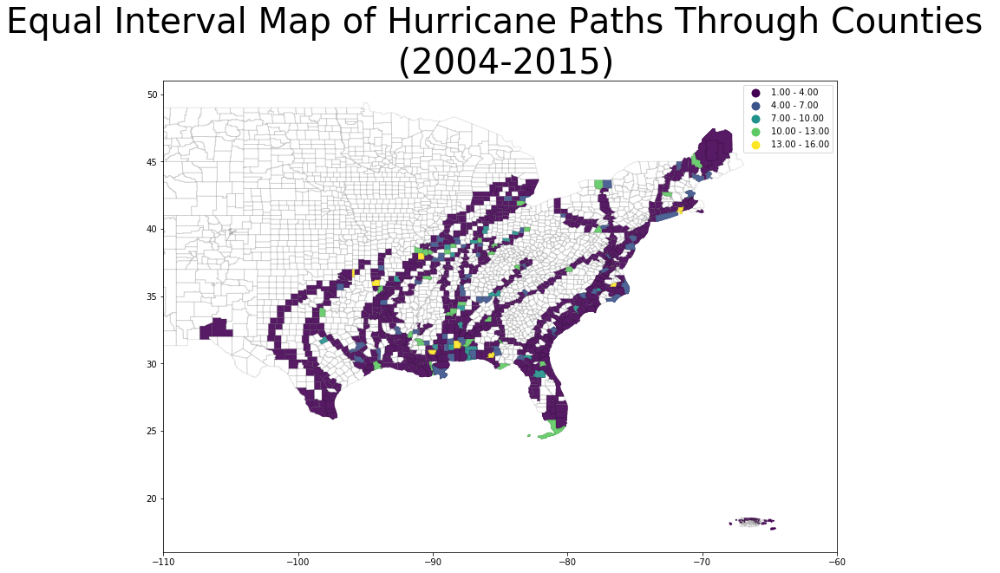

In [47]:
count = 'Count_x'

fig, axsub = plt.subplots(1,1, figsize = (15,10))
axsub.set(xlim=(-110, -60), ylim=(16, 51))
axsub.set_title('Equal Interval Map of Hurricane Paths Through Counties \n (2004-2015)',fontdict={'fontsize' : '40', 'fontweight' : '3'})
county_counts.plot(column = count, scheme='equal_interval', linewidth= 1.0, ax=axsub, legend=True, k=5)
counties.plot(color='white',edgecolor = 'black',ax = axsub, alpha=0.1)
#roads.plot(ax = axsub, color = 'black',alpha = 0.5)

In [150]:
class Report:
    def __init__(self, hurricane, counties):
        self.hurricane = hurricane
        self.counties = counties
    def results(self, hurricane, counties):
        count = 0
        for index, row in hurricane.iterrows():
            for index, i in counties.iterrows():
                if (row['geometry'].intersects(i['geometry'])):
                    return (hurricane['name'] + ' passes ' + counties['NAME'] +' at time: ' + str(hurricane['Time'][0]) + ' on ' + str(hurricane['month'][0]) +'-' +str(hurricane['day'][0])+'-' + str(hurricane['year'][0])) 
                    #('Hurricane %s passes county %s at %s-%s-%s %d' % (name, row['NAME'], str(date_time[0])[0:4], str()))
                    count = count + 1

In [151]:
MSP = pd.read_csv('MisEnPlaceFloat.csv')
MSP['long'] = 0 - MSP['long']
MSP['coordinates'] = MSP[['long', 'lat']].values.tolist()
MSP['coordinates'] = MSP['coordinates'].apply(Point)
MSP = gpd.GeoDataFrame(MSP, geometry='coordinates')
geometry = [Point(xy) for xy in zip(MSP.long, MSP.lat)]
MSP = GeoDataFrame(MSP, geometry=geometry) 
#MEP = MEP.groupby(['year','name'])['geometry'].apply(lambda x: LineString(x.tolist()))
#MEP = GeoDataFrame(MEP, geometry='geometry')
#MSP

In [152]:
data = Report(MSP, mergedcounties)
data.results(MSP, mergedcounties)

0       Arline passes Las Piedras at time: 1800 on 6-8...
1            Arline passes Clay at time: 1800 on 6-8-2005
2            Arline passes Clay at time: 1800 on 6-8-2005
3          Arline passes Jasper at time: 1800 on 6-8-2005
4          Arline passes Jasper at time: 1800 on 6-8-2005
                              ...                        
5043                                                  NaN
5044                                                  NaN
5045                                                  NaN
5046                                                  NaN
5047                                                  NaN
Length: 5048, dtype: object

## Project Contributions

Overall between us both, we had a fair and equal share of tasks. Our plan in the initial phase was to both attack the problem seperately and incorporate results from whoever's code worked. After we tackled one problem, we would both implement the code and then move on to the next task. Avi spent a good deal of time organizing the data, while I figured how to manipulate the data frames into a usable form. The other tasks were split half-half with one party making initial progress and the other implementing the code to a geographic representation. For instance, Avi was able to convert points to coordinates/linestrings, and then I was able to create a map. This continued on for the rest of the project. Overall, Avi was able to create the objects, and I was able to take the objects and create meaningful representations out of them i.e. intersect method, joins, choropleth. We found this splitting up of tasks to be a fair and efficient way of finishing the project.